# **EEG Xtra Processing Framework**

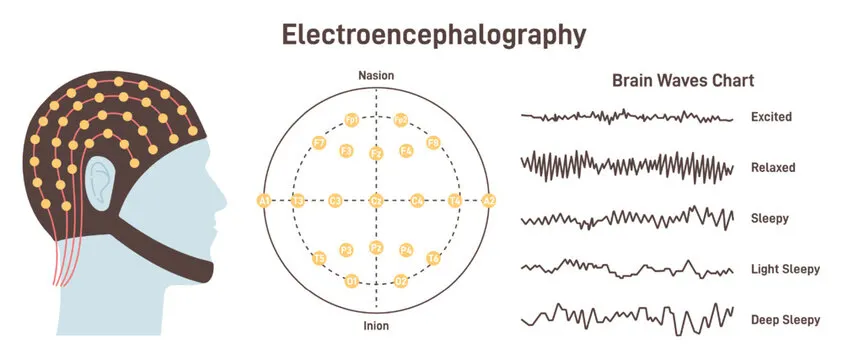

In [8]:
# Import necessary libraries
import os
import mne
import json
import scipy
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline 
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from typing import Dict, List, Tuple, Optional, Union


# Set environment
mne.set_log_level('WARNING')  # Reduce verbosity

In [9]:
# Subject and session
subject = 'sub-06'
session = 'DBSOFF'
task = 'bima'

# Base directory
base_path = '/home/jaizor/jaizor/xtra/data/PD_dataset'


# Build the correct path
mff_path = '/home/jaizor/jaizor/xtra/data/Bim_PD/PD_001_bima_DBSOFF.mff'

# GPSI/GPSC file
gpsc_file = '/home/jaizor/jaizor/xtra/data/ghw280_from_egig.gpsc'

# Output directory
output_path = f'/home/jaizor/jaizor/xtra/derivatives/working/{subject}/{task}_{session}'
os.makedirs(output_path, exist_ok=True)

print("Subject:", subject)
print("MFF:", mff_path)

Subject: sub-06
MFF: /home/jaizor/jaizor/xtra/data/Bim_PD/PD_001_bima_DBSOFF.mff


In [10]:
# Read the raw data from .mff
raw = mne.io.read_raw_egi(mff_path, preload=True)

## MNE Montage Creation

In [11]:
# Rename channels to match .gpsc file
channel_map = {str(i): f'E{i}' for i in range(1, 281)}
channel_map['REF CZ'] = 'Cz'
raw.rename_channels(channel_map)


<RawMff | signal1.bin, 291 x 383951 (767.9 s), ~852.8 MiB, data loaded>

In [12]:
# MNE Montage Creation

# Parse .gpsc file with dynamic coordinate normalization
def parse_gpsc(filepath):
    """Parse .gpsc file and normalize coordinates to center the origin.
    
    Args:
        filepath (str): Path to .gpsc file.
    
    Returns:
        List of tuples: [(name, x, y, z), ...] in millimeters
    """
    channels = []
    with open(filepath, 'r') as file:
        lines = file.readlines()
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 4:
            continue
        name = parts[0]
        try:
            x, y, z = map(float, parts[1:4])
            channels.append((name, x, y, z))
        except ValueError:
            continue
    return channels

# Read .gpsc file and normalize coordinates
channels = parse_gpsc(gpsc_file)

# Normalize coordinates to center the origin
if channels:
    gpsc_array = np.array([ch[1:4] for ch in channels])
    mean_pos = np.mean(gpsc_array, axis=0)  # Mean position in mm
    print(f"Original mean position (mm): {mean_pos}")
    channels_normalized = [(ch[0], ch[1] - mean_pos[0], ch[2] - mean_pos[1], ch[3] - mean_pos[2]) for ch in channels]
    
    # Convert to meters for MNE
    ch_pos = {ch[0]: np.array(ch[1:4]) / 1000.0 for ch in channels_normalized}
    
    # Set fiducials (adjusted by the same mean offset)
    fid_nz = ch_pos['FidNz']
    fid_t9 = ch_pos['FidT9']
    fid_t10 = ch_pos['FidT10']
    
    # Print normalized fiducial coordinates for verification
    print("\nNormalized fiducial coordinates (meters):")
    print(f"FidNz (nasion): {fid_nz}")
    print(f"FidT9 (lpa): {fid_t9}")
    print(f"FidT10 (rpa): {fid_t10}")
else:
    raise ValueError("No valid channels found in .gpsc file")

# Create MNE montage (coordinates in meters)
montage = mne.channels.make_dig_montage(
    ch_pos=ch_pos,
    nasion=fid_nz,
    lpa=fid_t9,
    rpa=fid_t10,
    coord_frame='head'
)

# Apply montage to raw data
raw.set_montage(montage, on_missing='warn')
print("Montage applied with coordinate normalization.")

# Verify montage alignment
print("\nVerifying montage alignment (coordinates in meters):")
print(f"FidNz (nasion): {fid_nz}")
print(f"FidT9 (lpa): {fid_t9}")
print(f"FidT10 (rpa): {fid_t10}")



Original mean position (mm): [100.83802817  94.83802817 166.92605634]

Normalized fiducial coordinates (meters):
FidNz (nasion): [ 0.00216197  0.10816197 -0.04492606]
FidT9 (lpa): [-0.07583803  0.00316197 -0.05492606]
FidT10 (rpa): [ 0.07516197  0.00616197 -0.05292606]
Montage applied with coordinate normalization.

Verifying montage alignment (coordinates in meters):
FidNz (nasion): [ 0.00216197  0.10816197 -0.04492606]
FidT9 (lpa): [-0.07583803  0.00316197 -0.05492606]
FidT10 (rpa): [ 0.07516197  0.00616197 -0.05292606]


### Referencing raw data to compare

Checking data for specified channels...
Cz mean: 0.00 µV, Cz std: 0.00 µV
E1 mean: 10881.75 µV, E1 std: 2069.68 µV
E2 mean: 7587.14 µV, E2 std: 2024.43 µV
Pre-referencing PSD channels (subset): ['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10']


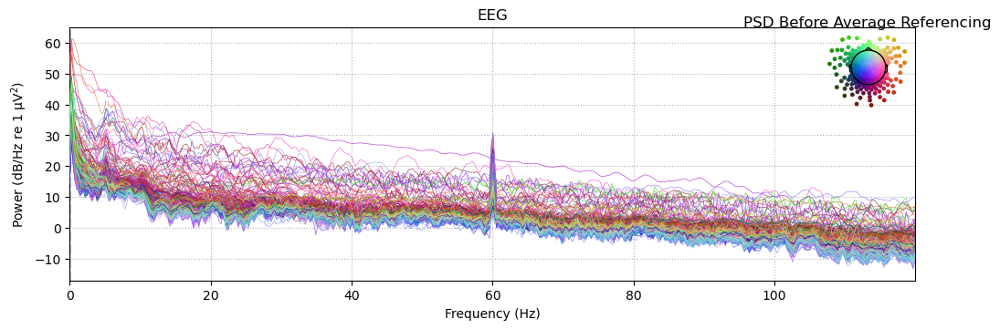

In [13]:
# Define the function for referencing and processing EEG data
def Referencing(raw, channels_to_check=['Cz', 'E1', 'E2'], fmax=100, max_channels_psd=280):
    """
    Process EEG data: select channels, check for dead channels, plot PSD, and apply average referencing.
    
    Parameters:
    -----------
    raw : mne.io.Raw
        The raw EEG data object.
    channels_to_check : list
        List of channel names to check for flat signals (default: ['Cz', 'E1', 'E2']).
    fmax : float
        Maximum frequency for PSD computation (default: 100 Hz).
    max_channels_psd : int
        Maximum number of EEG channels for PSD plot (default: 280).
    
    Returns:
    --------
    raw_ref : mne.io.Raw
        The processed raw object with average reference applied and bad channels interpolated.
    """
    # Select EEG and stimulus channels
    raw = raw.pick(['eeg', 'stim'])

    # Check specified channels for mean and std
    print("Checking data for specified channels...")
    for ch in channels_to_check:
        try:
            ch_data = raw.get_data(picks=[ch])[0] * 1e6  # Convert to microvolts
            ch_mean = np.mean(ch_data)
            ch_std = np.std(ch_data)
            print(f"{ch} mean: {ch_mean:.2f} µV, {ch} std: {ch_std:.2f} µV")
            if ch_std < 1e-6:
                print(f"Warning: {ch} appears to be a dead channel (flat or near-zero signal).")
                raw.info['bads'].append(ch)
        except Exception as e:
            print(f"Error checking channel {ch}: {e}")

    # Plot PSD before referencing
    eeg_picks = [ch for ch in raw.ch_names 
                 if ch not in raw.info['bads'] and raw.get_channel_types([ch])[0] == 'eeg'][:max_channels_psd]
    print("Pre-referencing PSD channels (subset):", eeg_picks[:10])
    try:
        psd = raw.compute_psd(fmax=fmax, picks=eeg_picks)
        psd.plot(spatial_colors=True)
        plt.title("PSD Before Average Referencing")
        plt.show()
    except Exception as e:
        print(f"Pre-referencing PSD plot failed: {e}")

    # Set average reference and interpolate bad channels
    try:
        raw_ref = raw.copy().set_eeg_reference('average')
        raw_ref.interpolate_bads()
    except Exception as e:
        print(f"Error applying average reference or interpolation: {e}")
        raw_ref = raw  # Return original raw if processing fails

    return raw_ref

raw_ref = Referencing(raw.copy(), channels_to_check=['Cz', 'E1', 'E2'], fmax=120, max_channels_psd=280)

## 1. Filtering and Notch Filtering

In [14]:
# Apply bandpass filter
raw_filtered = raw.copy().filter(
    l_freq=1.0, h_freq=100.0, picks=['eeg'], filter_length='auto',
    l_trans_bandwidth='auto', h_trans_bandwidth='auto',
    method='fir', phase='zero', fir_window='hamming', fir_design='firwin', n_jobs=1
)

# Apply notch filter at 60 Hz and its harmonics
nyquist_freq = raw_filtered.info["sfreq"] / 2
notch_freqs = np.arange(60, nyquist_freq, 60)  # 60 Hz and its harmonics

raw_filtered.notch_filter(
    freqs=notch_freqs,                  # test for 60 Hz
    picks='eeg',
    method='spectrum_fit',  # Use spectrum_fit method for notch filtering
    filter_length='auto',       # fine
    mt_bandwidth=1.0,           # bandwidth of the multitaper (you can tune this)
    p_value=0.05                # significance level of F-test
)



<RawMff | signal1.bin, 291 x 383951 (767.9 s), ~852.8 MiB, data loaded>

Marked Cz as bad due to flat signal.


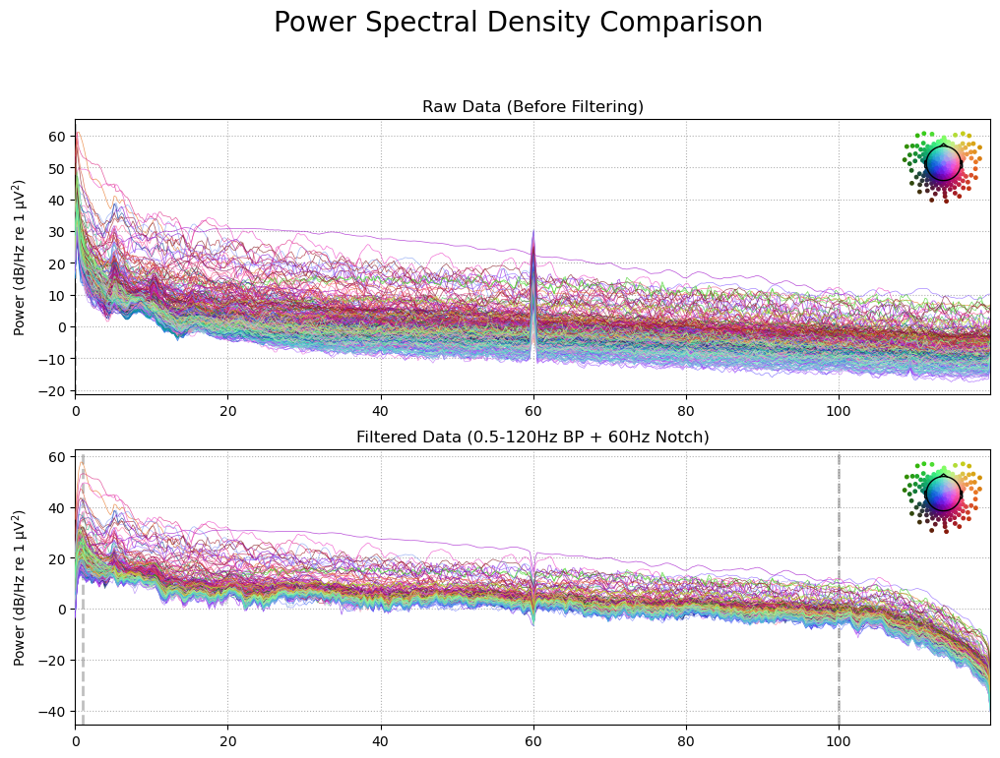

In [15]:
# Mark Cz as bad if flat
if np.std(raw_filtered.get_data(picks=['Cz'])[0]) < 1e-6:
    raw_filtered.info['bads'].append('Cz')
    print("Marked Cz as bad due to flat signal.")
  

# Create figure and plot
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# Before filtering
raw_ref.compute_psd(picks='eeg', exclude='bads', fmax=120).plot(axes=ax1, show=False)
ax1.set_title('Raw Data (Before Filtering)')  # Subplot title

# After filtering
raw_filtered.compute_psd(picks='eeg', exclude='bads', fmax=120).plot(axes=ax2, show=False)
ax2.set_title('Filtered Data (0.5-120Hz BP + 60Hz Notch)')  # Subplot title

# Add MAIN title (use suptitle for overall title)
plt.suptitle('Power Spectral Density Comparison', y=1.02, fontsize=20)  # y=1.02 avoids overlap
plt.show()

## 2. Trim & Select Events

In [16]:
stim_channels = [c for c in raw_filtered.ch_names if 'a' in c or 'TT' in c]
print("\nStim channels defined:", stim_channels)


Stim channels defined: ['TT140', 'TT255', '1a', '2a', '3a', '4a', '5a', '6a', '7a', '8a']


In [17]:
class EventTrimmer:
    """
    Trim EEG data based on trigger channels, preserve stim channels, align external events,
    and optionally save cropping metadata to JSON.
    
    New Features:
    - save_json: saves cropping parameters and onsets
    - align_events: optional toggle for external event alignment
    """

    def __init__(
        self,
        raw_filtered: mne.io.Raw,
        output_path: str,
        subject: str,
        trigger_pairs: tuple = ('1a', '6a'),
        pre_time: float = 5.0,
        post_time: float = 5.0,
        stim_channels: List[str] = None,
        events_base: str = None,
        project_id: str = "Sbj01",
        plot: bool = True,
        save: bool = True,
        save_json: bool = True,
        align_events: bool = True  # ← NEW: control event alignment
    ):
        # Inputs
        self.raw = raw_filtered
        self.output_path = output_path
        self.subject = subject
        self.first_trig, self.last_trig = trigger_pairs
        self.pre_time = pre_time
        self.post_time = post_time
        self.stim_channels = stim_channels or ['TT140', 'TT255', '1a', '2a', '3a', '4a', '5a', '6a']
        self.events_base = events_base
        self.project_id = project_id
        self.plot = plot
        self.save = save
        self.save_json = save_json
        self.align_events = align_events  # ← Used to skip alignment

        # Auto-detect events base if not provided
        if self.events_base is None:
            self.events_base = os.path.join(os.path.dirname(self.output_path), "Events")

        # Outputs
        self.raw_cropped = None
        self.stim_raw = None
        self.onsets = {}
        self.tmin_trim = None
        self.tmax_trim = None

    def detect_onsets(self) -> Dict[str, np.ndarray]:
        """Detect rising edges in trigger channels."""
        sfreq = self.raw.info['sfreq']
        picks = [self.first_trig, self.last_trig]
        picks = [ch for ch in picks if ch in self.raw.ch_names]
        if len(picks) < 2:
            raise ValueError(f"Trigger channels missing: {picks}")

        data, times = self.raw[picks, :]
        sig_1a = data[0] if len(data) > 0 else np.zeros_like(times)
        sig_6a = data[1] if len(data) > 1 else np.zeros_like(times)

        def find_onsets(signal):
            diff = np.diff((signal > 0.5).astype(int))
            return np.where(diff == 1)[0] + 1

        onsets_1a = find_onsets(sig_1a) / sfreq
        onsets_6a = find_onsets(sig_6a) / sfreq

        self.onsets = {self.first_trig: onsets_1a, self.last_trig: onsets_6a}
        
        print(f"✅ {self.first_trig}: {len(onsets_1a)} onsets | First: {onsets_1a[0]:.3f}s")
        print(f"✅ {self.last_trig}: {len(onsets_6a)} onsets | Last: {onsets_6a[-1]:.3f}s")
        
        return self.onsets

    def trim_data(self) -> mne.io.Raw:
        """Crop data based on first and last triggers."""
        onsets = self.onsets
        sfreq = self.raw.info['sfreq']
        tmax_orig = self.raw.times[-1]

        self.tmin_trim = max(0.0, onsets[self.first_trig][0] - self.pre_time)
        self.tmax_trim = min(tmax_orig, onsets[self.last_trig][-1] + self.post_time)

        print(f"\n✂️ Trimming data to: {self.tmin_trim:.3f}s → {self.tmax_trim:.3f}s "
              f"({self.tmax_trim - self.tmin_trim:.2f}s)")

        self.raw_cropped = self.raw.copy().crop(tmin=self.tmin_trim, tmax=self.tmax_trim)
        
        if self.plot:
            self._plot_triggers_and_crop()
        
        # Save cropping metadata
        if self.save_json:
            self._save_cropping_json()
        
        return self.raw_cropped

    def _plot_triggers_and_crop(self):
        """Plot triggers and cropping region."""
        raw = self.raw
        times = raw.times
        sig_1a = raw.get_data(picks=[self.first_trig])[0] if self.first_trig in raw.ch_names else np.zeros_like(times)
        sig_6a = raw.get_data(picks=[self.last_trig])[0] if self.last_trig in raw.ch_names else np.zeros_like(times)

        plt.figure(figsize=(16, 6))
        plt.plot(times, sig_6a, color='lavender', linewidth=1, label=self.last_trig)
        plt.vlines(self.onsets[self.first_trig], ymin=1.0, ymax=1.4, color='indigo', alpha=0.7, label=f"{self.first_trig} onsets")
        plt.vlines(self.onsets[self.last_trig], ymin=-0.2, ymax=0.2, color='darkviolet', alpha=0.7, label=f"{self.last_trig} onsets")
        plt.axvspan(self.tmin_trim, self.tmax_trim, color='azure', alpha=0.3, label="Cropped Region")
        plt.axvline(self.onsets[self.first_trig][0], color='purple', linestyle='--', linewidth=2, label=f"First '{self.first_trig}'")
        plt.axvline(self.onsets[self.last_trig][-1], color='indigo', linestyle='--', linewidth=2, label=f"Last '{self.last_trig}'")

        plt.title(f"Trigger Channels '{self.first_trig}' and '{self.last_trig}' — Trim Region", fontsize=14)
        plt.xlabel("Time (s)")
        plt.ylabel("Digital Signal")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    def _save_cropping_json(self):
        """Save trimming metadata to JSON."""
        json_path = os.path.join(self.output_path, f"{self.subject}_cropping_info.json")
        crop_info = {
            "subject": self.subject,
            "tmin_trim": float(self.tmin_trim),
            "tmax_trim": float(self.tmax_trim),
            "duration_seconds": float(self.tmax_trim - self.tmin_trim),
            "first_trigger": self.first_trig,
            "last_trigger": self.last_trig,
            "pre_time_seconds": self.pre_time,
            "post_time_seconds": self.post_time,
            "onset_first_trigger_first": float(self.onsets[self.first_trig][0]),
            "onset_last_trigger_last": float(self.onsets[self.last_trig][-1]),
            "n_onsets_first_trigger": int(len(self.onsets[self.first_trig])),
            "n_onsets_last_trigger": int(len(self.onsets[self.last_trig])),
            "sampling_frequency": float(self.raw.info['sfreq']),
            "stim_channels_preserved": [ch for ch in self.stim_channels if ch in self.raw_cropped.ch_names],
            "cropped_n_samples": int(self.raw_cropped.n_times),
            "meas_date": self.raw_cropped.info.get('meas_date', None)
        }

        with open(json_path, 'w') as f:
            json.dump(crop_info, f, indent=2, default=str)

        print(f"📄 Cropping metadata saved to: {json_path}")

    def preserve_stim_channels(self) -> mne.io.RawArray:
        """Extract stim channels for post-ICA re-adding."""
        ch_names = [ch for ch in self.stim_channels if ch in self.raw_cropped.ch_names]
        if not ch_names:
            raise ValueError("No stim channels found after cropping.")

        data = self.raw_cropped.get_data(picks=ch_names)
        info = mne.create_info(ch_names, sfreq=self.raw_cropped.info['sfreq'], ch_types='stim')
        self.stim_raw = mne.io.RawArray(data, info)
        self.stim_raw.set_meas_date(self.raw_cropped.info['meas_date'])

        print(f"✅ Preserved stim channels: {ch_names}")
        return self.stim_raw

    def align_external_events(self):
        """Align external .fif/.json events with cropped data — only if enabled."""
        if not self.align_events or not self.save:
            print("⏭️ Skipping external event alignment (disabled).")
            return

        events_fif = os.path.join(self.events_base, f"{self.project_id}_events_mne_binary-eve.fif")
        events_json = os.path.join(self.events_base, f"{self.project_id}_event_id_binary.json")

        for path in [events_fif, events_json]:
            if not os.path.exists(path):
                raise FileNotFoundError(f"Missing event file: {path}")

        # Load
        events_full = mne.read_events(events_fif)
        with open(events_json, 'r') as f:
            event_id = json.load(f)

        sfreq = self.raw.info['sfreq']
        event_times_sec = events_full[:, 0] / sfreq

        # Filter to cropped window
        in_window = (event_times_sec >= self.tmin_trim) & (event_times_sec <= self.tmax_trim)
        events_cropped = events_full[in_window].copy()
        events_cropped[:, 0] -= int(self.tmin_trim * sfreq)  # re-reference

        # Clean keys
        event_id_clean = {k.replace('-', '').replace(' ', ''): v for k, v in event_id.items()}

        # Save
        out_events = os.path.join(self.output_path, f"{self.subject}_events_mne_binary-eve.fif")
        out_id = os.path.join(self.output_path, f"{self.subject}_event_id_binary.json")

        mne.write_events(out_events, events_cropped, overwrite=True)
        with open(out_id, 'w') as f:
            json.dump(event_id_clean, f, indent=2)

        print("\n✅ EVENT ALIGNMENT COMPLETE")
        print(f"   Original events: {len(events_full)}")
        print(f"   After trimming:  {len(events_cropped)}")
        print(f"   Duration: {self.tmin_trim:.2f}s → {self.tmax_trim:.2f}s")
        print(f"   Events saved to: {out_events}")
        print(f"   Event ID saved to: {out_id}")
        print("   Event IDs:", event_id_clean)

    def run(self) -> tuple[mne.io.Raw, mne.io.RawArray]:
        """
        Run full pipeline.
        
        Returns
        -------
        raw_cropped : mne.io.Raw
            Trimmed EEG data.
        stim_raw : mne.io.RawArray
            Preserved stim channels.
        """
        print("🔍 Starting event-based trimming...")
        self.detect_onsets()
        self.trim_data()
        self.preserve_stim_channels()
        self.align_external_events()
        print("✅ Trimming & event alignment complete.")
        return self.raw_cropped, self.stim_raw

🔍 Starting event-based trimming...
✅ 1a: 200 onsets | First: 252.418s
✅ 6a: 200 onsets | Last: 679.362s

✂️ Trimming data to: 247.418s → 684.362s (436.94s)


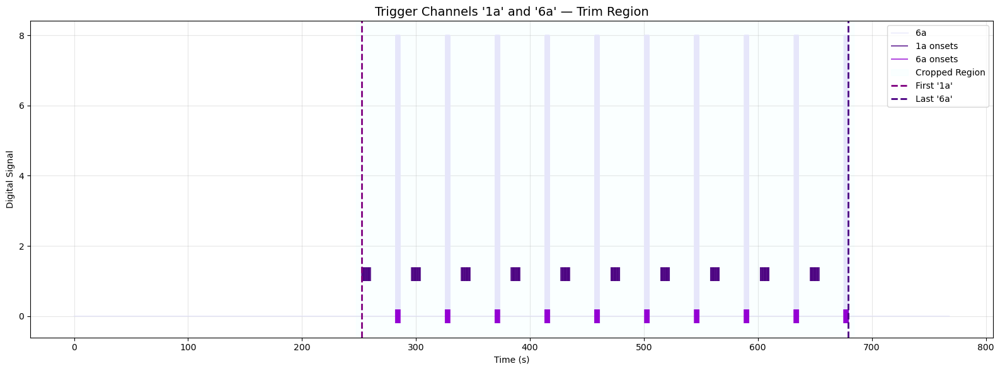

📄 Cropping metadata saved to: /home/jaizor/jaizor/xtra/derivatives/working/sub-06/bima_DBSOFF/sub-06_cropping_info.json
✅ Preserved stim channels: ['TT140', 'TT255', '1a', '2a', '3a', '4a', '5a', '6a', '7a', '8a']

✅ EVENT ALIGNMENT COMPLETE
   Original events: 585
   After trimming:  580
   Duration: 247.42s → 684.36s
   Events saved to: /home/jaizor/jaizor/xtra/derivatives/working/sub-06/bima_DBSOFF/sub-06_events_mne_binary-eve.fif
   Event ID saved to: /home/jaizor/jaizor/xtra/derivatives/working/sub-06/bima_DBSOFF/sub-06_event_id_binary.json
   Event IDs: {'InPhase': 0, 'OutofPhase': 1}
✅ Trimming & event alignment complete.


In [18]:
trimmer = EventTrimmer(
    raw_filtered=raw_filtered,
    output_path=output_path,
    subject=subject,
    trigger_pairs=('1a', '6a'),
    pre_time=5.0,
    post_time=5.0,
    stim_channels= stim_channels,
    events_base="/home/jaizor/jaizor/xtra/data/Events",
    project_id="Sbj01",
    plot=True,
    save=True,
    save_json=True,
    align_events=True  # ← Enabled
)

raw_filtered, stim_raw = trimmer.run()

## 3. Artifact Detection

In [19]:
# Function to Analyze channels

def analyze_bad_channels(
    raw: mne.io.Raw, 
    ch_pos: Dict[str, Tuple[float, float, float]], 
    picks: Optional[List[str]] = None, 
    title_psd: str = "Power Spectral Density",
    fontsize: int = 8,
    fmax: float = 100,
    colormap: str = 'viridis',
    duration_plot: float = 200.0,
    variance_z_threshold: float = 2.0,
    show_plots: bool = True
) -> Dict[str, Union[List[str], np.ndarray, Dict]]:
    """
    Analyze EEG channels with PSD, quality assessment, and topomap visualization.
    
    Parameters
    ----------
    raw : mne.io.Raw
        Raw EEG data (with montage set).
    ch_pos : dict
        Dictionary of channel positions {ch_name: (x,y,z)}.
    picks : list of str, optional
        Channels to include. If None, plot all good channels.
    title_psd : str
        Title for PSD plot.
    fontsize : int
        Font size for channel labels.
    fmax : float
        Max frequency for PSD.
    colormap : str
        Matplotlib colormap name for all plots.
    duration_plot : float
        Duration in seconds for time series plot.
    variance_z_threshold : float
        Z-score threshold for variance outlier detection.
    show_plots : bool
        Whether to display plots.
        
    Returns
    -------
    dict
        Analysis results containing channel metrics and problematic channels.

    # Apply average reference if not already done
    if not raw_copy.info.get('custom_ref_applied', False):
        print("Applying average reference...")
        raw_copy.set_eeg_reference('average', projection=True)
    
    """
    # Create a copy to avoid modifying the original
    raw_copy = raw.copy()
    

    # Filter valid picks
    if picks is None:
        picks = [ch for ch in raw_copy.ch_names 
                if ch in ch_pos and ch not in raw_copy.info['bads']]
        print(f"Auto-selected {len(picks)} channels: {picks[:5]}{'...' if len(picks) > 5 else ''}")
    else:
        valid_picks = [ch for ch in picks 
                      if ch in ch_pos and ch not in raw_copy.info['bads']]
        invalid_picks = [ch for ch in picks if ch not in valid_picks]
        if invalid_picks:
            print(f"Warning: Skipping invalid channels: {invalid_picks}")
        picks = valid_picks
    
    if not picks:
        raise ValueError("No valid channels to plot. Check channel names and bad channels list.")
    
    print(f"Plotting {len(picks)} channels")
    print(f"Bad channels: {raw_copy.info['bads']}")
    
    # Generate colors from specified colormap
    cmap = plt.get_cmap(colormap)
    colors = cmap(np.linspace(0, 1, len(picks)))
    color_dict = {ch: colors[i] for i, ch in enumerate(picks)}
    
    # Initialize results dictionary
    results = {
        'analyzed_channels': picks,
        'bad_channels': raw_copy.info['bads'].copy(),
        'metrics': {},
        'problematic_channels': []
    }
    
    # ==== CHANNEL QUALITY ASSESSMENT (moved first for efficiency) ====
    print("Assessing channel quality...")
    try:
        # Get data for analysis (use shorter segment if data is very long)
        max_samples = int(60 * raw_copy.info['sfreq'])  # Max 60 seconds for quality assessment
        data_full = raw_copy.get_data(picks=picks, stop=min(max_samples, raw_copy.n_times))
        
        # Calculate statistics
        variances = np.var(data_full, axis=1)
        means = np.mean(np.abs(data_full), axis=1)
        max_vals = np.max(np.abs(data_full), axis=1)
        
        # Identify problematic channels
        z_scores = np.abs((variances - np.mean(variances)) / (np.std(variances) + 1e-12))
        problematic_indices = np.where(z_scores > variance_z_threshold)[0]
        problematic_channels = [picks[i] for i in problematic_indices]
        
        # Store metrics
        results['metrics'] = {
            'variances': variances,
            'means': means,
            'max_vals': max_vals,
            'z_scores': z_scores
        }
        results['problematic_channels'] = problematic_channels
        
        if problematic_channels:
            print(f"Problematic channels (Z-score > {variance_z_threshold}): {problematic_channels}")
        
        if show_plots:
            _plot_quality_assessment(picks, variances, means, max_vals, z_scores, 
                                   color_dict, variance_z_threshold)
            
    except Exception as e:
        print(f"Error in quality assessment: {e}")
        results['metrics'] = {}
    
    # ==== PSD ANALYSIS ====
    if show_plots:
        try:
            print("Computing PSD...")
            psd = raw_copy.compute_psd(picks=picks, fmax=fmax, n_fft=2048, verbose=False)
            _plot_psd(psd, picks, color_dict, title_psd)
            
        except Exception as e:
            print(f"Error creating PSD plot: {e}")
    
    # ==== TOPOMAP VISUALIZATION ====
    if show_plots:
        try:
            print("Generating topomap visualization...")
            _plot_topomap(picks, ch_pos, color_dict, problematic_channels)
            
        except Exception as e:
            print(f"Error creating topomap: {e}")
    
    # ==== TIME SERIES PLOT ====
    if show_plots:
        try:
            print("Creating time series plot...")
            duration = min(duration_plot, raw_copy.times[-1])
            _plot_time_series(raw_copy, picks, color_dict, duration)
            
        except Exception as e:
            print(f"Error creating time series plot: {e}")
    
    print(f"\nSuccessfully analyzed {len(picks)} channels.")
    return results


def _plot_quality_assessment(picks: List[str], variances: np.ndarray, means: np.ndarray, 
                           max_vals: np.ndarray, z_scores: np.ndarray, 
                           color_dict: Dict[str, np.ndarray], threshold: float):
    """Plot channel quality assessment metrics."""
    fig_quality, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 8))
    
    x_pos = range(len(picks))
    
    # Variance plot
    bars1 = ax1.bar(x_pos, variances * 1e12, color=[color_dict[ch] for ch in picks])
    ax1.set_xlabel('Channel Index')
    ax1.set_ylabel('Variance (µV²)')
    ax1.set_title('Channel Variance')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(picks, rotation=45, ha='right')
    ax1.grid(True, alpha=0.3)
    
    # Mean absolute amplitude
    bars2 = ax2.bar(x_pos, means * 1e6, color=[color_dict[ch] for ch in picks])
    ax2.set_xlabel('Channel Index')
    ax2.set_ylabel('Mean |Amplitude| (µV)')
    ax2.set_title('Mean Absolute Amplitude')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(picks, rotation=45, ha='right')
    ax2.grid(True, alpha=0.3)
    
    # Max amplitude
    bars3 = ax3.bar(x_pos, max_vals * 1e6, color=[color_dict[ch] for ch in picks])
    ax3.set_xlabel('Channel Index')
    ax3.set_ylabel('Max |Amplitude| (µV)')
    ax3.set_title('Maximum Absolute Amplitude')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(picks, rotation=45, ha='right')
    ax3.grid(True, alpha=0.3)
    
    # Z-score of variance
    bars4 = ax4.bar(x_pos, z_scores, color=[color_dict[ch] for ch in picks])
    ax4.axhline(y=threshold, color='red', linestyle='--', alpha=0.7, 
               label=f'Z={threshold} threshold')
    ax4.axhline(y=3, color='red', linestyle='-', alpha=0.7, label='Z=3 threshold')
    ax4.set_xlabel('Channel Index')
    ax4.set_ylabel('Z-score of Variance')
    ax4.set_title('Variance Outlier Detection')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(picks, rotation=45, ha='right')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.suptitle('Channel Quality Assessment', fontsize=16, weight='bold')
    plt.tight_layout()
    plt.show()


def _plot_psd(psd, picks: List[str], color_dict: Dict[str, np.ndarray], title: str):
    """Plot power spectral density."""
    fig_psd, ax_psd = plt.subplots(figsize=(12, 6))
    
    freqs = psd.freqs
    for i, ch in enumerate(picks):
        ch_idx = psd.ch_names.index(ch)
        psd_data = psd.get_data()[ch_idx, :]
        ax_psd.semilogy(freqs, psd_data, label=ch, color=color_dict[ch], 
                       linewidth=2, alpha=0.8)
    
    ax_psd.set_xlabel('Frequency (Hz)', fontsize=12)
    ax_psd.set_ylabel('Power Spectral Density (V²/Hz)', fontsize=12)
    ax_psd.set_title(title, fontsize=14, weight='bold')
    ax_psd.grid(True, alpha=0.3)
    ax_psd.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


def _plot_topomap(picks: List[str], ch_pos: Dict[str, Tuple[float, float, float]], 
                 color_dict: Dict[str, np.ndarray], problematic_channels: List[str]):
    """Plot topomap with channel locations."""
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Prepare positions
    pos = np.array([ch_pos[ch][:2] for ch in picks])
    
    # Scale coordinates
    max_radius = np.max(np.sqrt(np.sum(pos**2, axis=1)))
    if max_radius > 0:
        pos_scaled = pos / max_radius * 0.1
        pos_scaled[:, 1] -= 0.02
    else:
        pos_scaled = pos
    
    # Plot all channels
    for i, (x, y) in enumerate(pos_scaled):
        color = color_dict[picks[i]]
        marker = 'o'
        alpha = 0.7
        size = 12
        
        # Highlight problematic channels
        if picks[i] in problematic_channels:
            marker = 's'  # Square marker
            size = 15
            alpha = 1.0
        
        ax.plot(x, y, marker, markersize=size, color=color, alpha=alpha)
        ax.text(x, y+0.01, picks[i], fontsize=10, ha='center', va='bottom', color=color)
    
    # Plot topomap background
    try:
        mne.viz.plot_topomap(np.zeros(len(pos_scaled)), pos_scaled, axes=ax, 
                            show=False, sphere=0.1, outlines='head')
    except Exception as e:
        print(f"Warning: Could not plot topomap background: {e}")
    
    ax.set_title('EEG Channel Locations\n(Problematic channels marked with squares)', 
                fontsize=12, pad=20)
    ax.set_xlim(-0.12, 0.12)
    ax.set_ylim(-0.12, 0.12)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def _plot_time_series(raw_copy, picks: List[str], color_dict: Dict[str, np.ndarray], 
                     duration: float):
    """Plot time series data."""
    fig_ts, axes = plt.subplots(len(picks), 1, figsize=(12, 2*len(picks)), 
                               sharex=True, sharey=False)
    if len(picks) == 1:
        axes = [axes]
    
    data, times = raw_copy[picks, :int(duration * raw_copy.info['sfreq'])]
    
    for i, (ch, ax) in enumerate(zip(picks, axes)):
        ax.plot(times, data[i, :] * 1e6, color=color_dict[ch], linewidth=1)
        ax.set_ylabel(f'{ch}\n(µV)', fontsize=10)
        ax.grid(True, alpha=0.3)
        
        # Add some basic statistics as text
        mean_val = np.mean(data[i, :]) * 1e6
        std_val = np.std(data[i, :]) * 1e6
        ax.text(0.02, 0.98, f'μ={mean_val:.1f}, σ={std_val:.1f}', 
               transform=ax.transAxes, verticalalignment='top', 
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
    axes[-1].set_xlabel('Time (s)', fontsize=12)
    plt.suptitle(f'Raw EEG Time Series (first {duration:.1f}s)', 
                fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()




In [20]:
# Calculate bad channels with median absolute deviation (MAD)
print("\nCalculating bad channels with median absolute deviation (MAD)...")
raw_eeg = raw_filtered.copy().pick("eeg")
channels = raw_eeg.info['ch_names']
data_ = raw_eeg.get_data() * 1e6  # Convert to microvolts
mad_scores = [scipy.stats.median_abs_deviation(data_[i, :], scale=1) for i in range(data_.shape[0])]
z_scores = 0.6745 * (mad_scores - np.nanmedian(mad_scores)) / scipy.stats.median_abs_deviation(mad_scores, scale=1)
bad_dev = [channels[i] for i in np.where(np.abs(z_scores) >= 9)[0]]

print(f"Bad channels based on MAD: {bad_dev}")


Calculating bad channels with median absolute deviation (MAD)...


Bad channels based on MAD: ['E83', 'E87', 'E111', 'E124', 'E129', 'E175', 'E176']


Plotting 7 channels
Bad channels: ['Cz']
Assessing channel quality...
Problematic channels (Z-score > 2.0): ['E87']


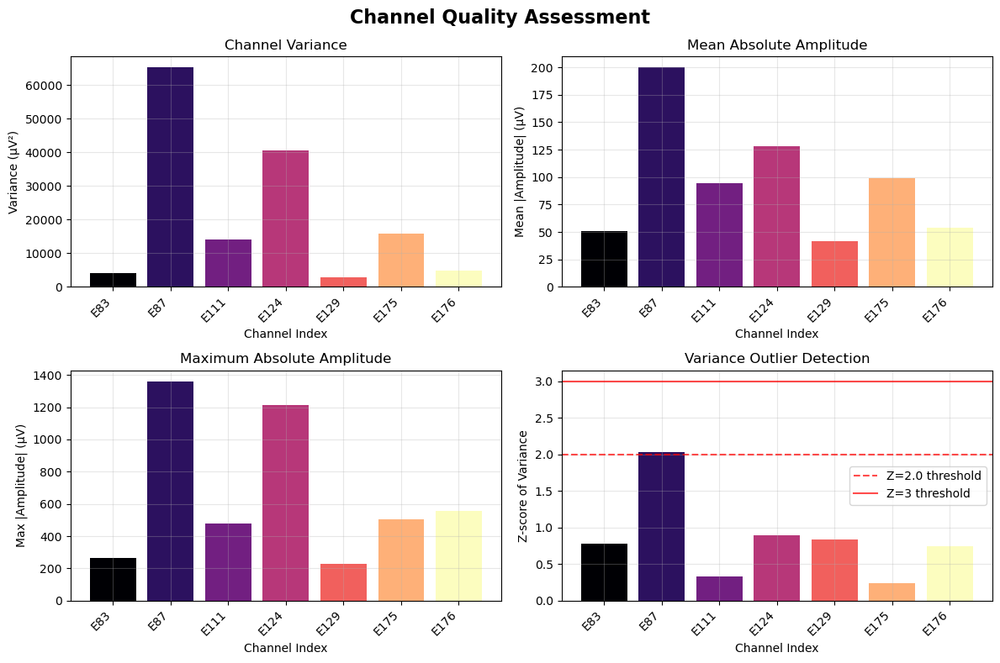

Computing PSD...


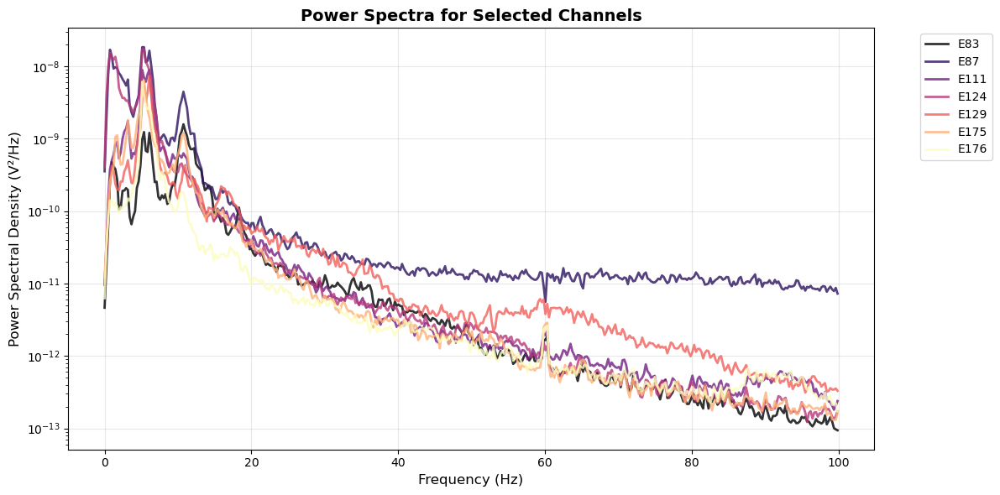

Generating topomap visualization...


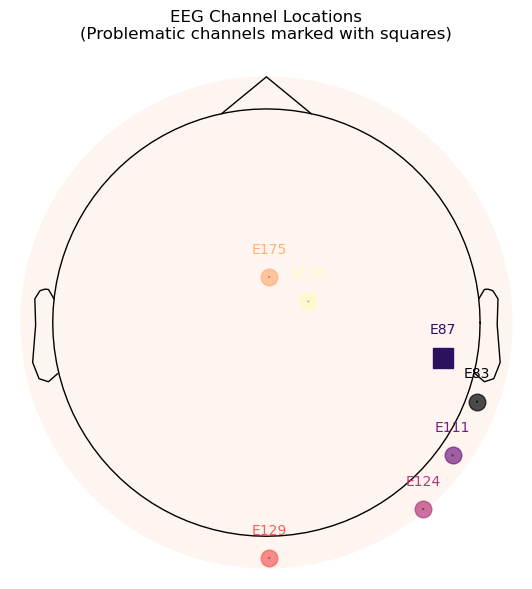

Creating time series plot...


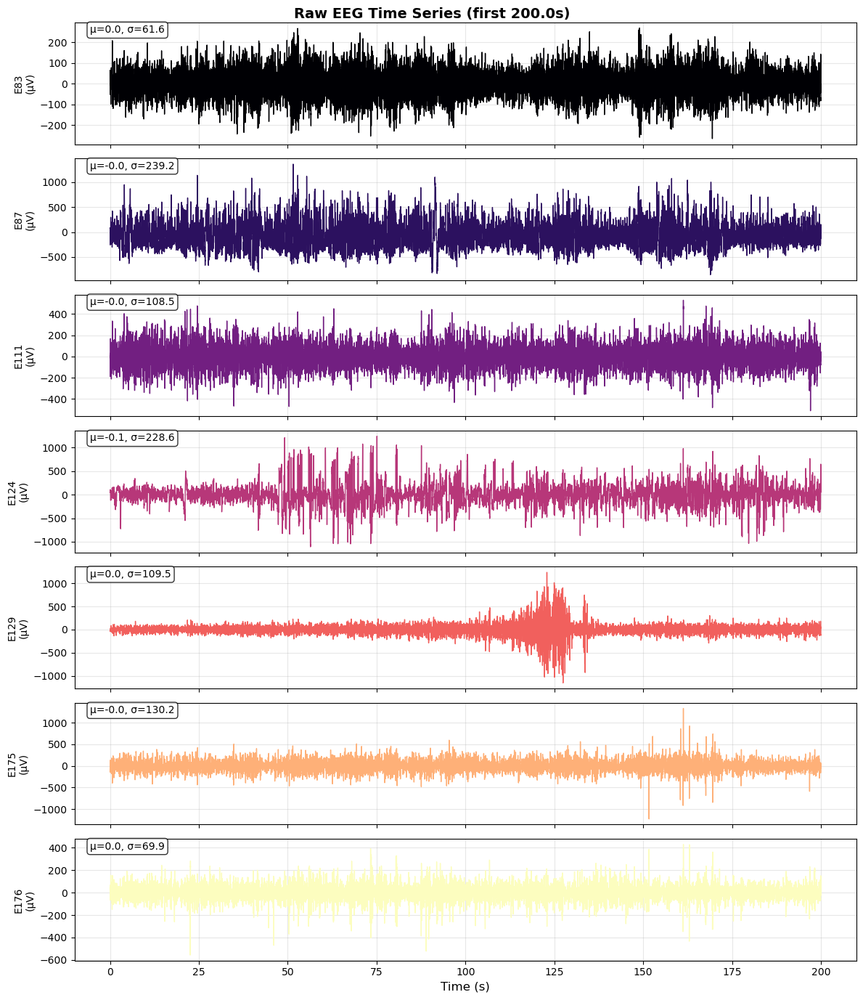


Successfully analyzed 7 channels.


In [21]:
# Check bad channels 
analyzed_channels = analyze_bad_channels(
    raw=raw_eeg,          # Your loaded raw EEG data
    ch_pos=ch_pos,    # Your channel positions dictionary
    picks=bad_dev,
    title_psd="Power Spectra for Selected Channels",
    fmax=100,                    # Maximum frequency to display
    colormap='magma'          # Color scheme (try 'plasma', 'magma', etc.)
)

In [22]:
# Select bad channels after recalculation
raw_filtered.info['bads'] = bad_dev

print(f"Mark Bad Channels: {bad_dev}")


Mark Bad Channels: ['E83', 'E87', 'E111', 'E124', 'E129', 'E175', 'E176']


## 4. Independent Component Analysis

In [37]:
# Automatic ICA cleaning function

from mne_icalabel import label_components
from scipy.stats import kurtosis



def run_automatic_ica_cleaning(eeg_data, n_components=0.99, show_plots=False, random_state=99, cmap='viridis'):
    results = {}

    # === 1. Data Preparation ===
    raw = eeg_data.copy()

    # Define key channels
    vveog_anode, vveog_cathode = 'E31', 'E19'  # Vertical EOG (blinks)
    heog_anode, heog_cathode = 'E41', 'E274'   # Horizontal EOG (saccades)
    ecg_anode, ecg_cathode = 'E227', 'E229'    # ECG
    emg_chs = ['E280', 'E52']                  # Facial EMG
    ft_chs = ['E31', 'E19']

    # 🔧 Fix: Identify all E-series channels and set them as EEG
    eeg_ch_names = [ch for ch in raw.ch_names if ch.startswith('E') and ch[1:].isdigit()]
    print(f"🔧 Found {len(eeg_ch_names)} E-series EEG channels")

    # Set all E* channels as EEG
    ch_types = {ch: 'eeg' for ch in eeg_ch_names}
    ch_types.update({ch: 'emg' for ch in emg_chs if ch in raw.ch_names})  # EMG
    raw.set_channel_types(ch_types)
    print(f"✅ Set {len(eeg_ch_names)} channels as EEG, {len([ch for ch in emg_chs if ch in raw.ch_names])} as EMG")

    # === 2. Add Bipolar Reference Channels ===
    raw_filtered = raw.copy()

    # Virtual VEOG (E31 - E19) → for blink detection
    if all(ch in raw_filtered.ch_names for ch in [vveog_anode, vveog_cathode]):
        raw_filtered = mne.set_bipolar_reference(
            raw_filtered,
            anode=vveog_anode,
            cathode=vveog_cathode,
            ch_name='vVEOG',
            drop_refs=False
        ).set_channel_types({'vVEOG': 'eog'})
        print("✅ Created VEOG (E31-E19) for blink detection")

    # Horizontal EOG (E41 - E274) → for saccades
    if all(ch in raw_filtered.ch_names for ch in [heog_anode, heog_cathode]):
        raw_filtered = mne.set_bipolar_reference(
            raw_filtered,
            anode=heog_anode,
            cathode=heog_cathode,
            ch_name='BLINK_H',
            drop_refs=False
        ).set_channel_types({'BLINK_H': 'eog'})
        print("✅ Created BLINK_H (E41-E274) for horizontal eye movement detection")

    # ECG_BIO (E227 - E229) → for heartbeat
    if all(ch in raw_filtered.ch_names for ch in [ecg_anode, ecg_cathode]):
        raw_filtered = mne.set_bipolar_reference(
            raw_filtered,
            anode=ecg_anode,
            cathode=ecg_cathode,
            ch_name='ECG_BIO',
            drop_refs=False
        ).set_channel_types({'ECG_BIO': 'ecg'})
        print("✅ Created ECG_BIO (E227-E229) for cardiac artifact detection")

    # === Apply preprocessing required for ICLabel ===
    # 1. Apply Common Average Reference (CAR)
    raw_filtered = raw_filtered.set_eeg_reference('average', verbose=False)
    print("✅ Applied Common Average Reference (CAR)")

    # 2. Apply 1–100 Hz bandpass filter
    raw_filtered = raw_filtered.filter(
        l_freq=1.0, h_freq=100.0,
        method='fir', phase='zero',
        verbose=False
    )
    print("✅ Applied 1–100 Hz bandpass filter")

    # === 3. Fit ICA on Filtered Data ===
    print("✅ Fitting ICA with Extended Infomax (for ICLabel compatibility)...")
    ica = mne.preprocessing.ICA(
        n_components=n_components,
        random_state=random_state,
        method='infomax',
        fit_params=dict(extended=True),
        max_iter='auto'
    )

    try:
        ica.fit(raw_filtered)
        print(f"✅ ICA fitted with {ica.n_components_} components")
    except Exception as e:
        print(f"❌ ICA fitting failed: {e}")
        raise

    # === 4. Automatic Artifact Detection ===
    ica.exclude = []
    blink_idx = []
    h_saccade_idx = []
    ecg_idx = []
    muscle_idx = []
    drift_idx = []
    line_noise_idx = []

    # --- Blink Detection using vVEOG ---
    if 'vVEOG' in raw_filtered.ch_names:
        print("🔭 Detecting blink components using vVEOG...")
        try:
            idx, _ = ica.find_bads_eog(raw_filtered, ch_name='vVEOG', measure='zscore', threshold=4.0)
            blink_idx = [int(i) for i in idx]
            ica.exclude.extend(blink_idx)
            print(f"✅ Blink components: {blink_idx}")
        except Exception as e:
            print(f"❌ Blink detection failed: {e}")

    # --- Horizontal Eye Movement Detection using BLINK_H ---
    if 'BLINK_H' in raw_filtered.ch_names:
        print("🔭 Detecting horizontal eye movement components using BLINK_H...")
        try:
            idx, _ = ica.find_bads_eog(raw_filtered, ch_name='BLINK_H', measure='zscore', threshold=3.5)
            h_saccade_idx = [int(i) for i in idx if i not in ica.exclude]
            ica.exclude.extend(h_saccade_idx)
            print(f"✅ Horizontal eye movement components: {h_saccade_idx}")
        except Exception as e:
            print(f"❌ Horizontal eye movement detection failed: {e}")

    # --- ECG Artifact Detection ---
    if 'ECG_BIO' in raw_filtered.ch_names:
        print("💓 Detecting ECG components...")
        try:
            idx, _ = ica.find_bads_ecg(raw_filtered, ch_name='ECG_BIO', method='correlation', measure='zscore', threshold=4.5)
            ecg_idx = [int(i) for i in idx]
            ica.exclude.extend(ecg_idx)
            print(f"✅ ECG components: {ecg_idx}")
        except Exception as e:
            print(f"❌ ECG detection failed: {e}")

    # --- Muscle Artifacts ---
    print("💪 Detecting muscle artifacts using E280/E52 (30–100 Hz)...")
    muscle_idx = []
    for ch_name in emg_chs:
        if ch_name not in raw_filtered.ch_names:
            continue
        try:
            idx, _ = ica.find_bads_eog(
                raw_filtered, ch_name=ch_name, measure='zscore',
                l_freq=30, h_freq=100, threshold=4.0
            )
            idx = [int(i) for i in idx]
            new_idx = [i for i in idx if i not in ica.exclude]
            muscle_idx.extend(new_idx)
            if new_idx:
                print(f"✅ Components linked to {ch_name}: {new_idx}")
        except Exception as e:
            print(f"❌ Failed to detect EMG for {ch_name}: {e}")
    muscle_idx = list(set(muscle_idx))
    ica.exclude.extend(muscle_idx)
    if muscle_idx:
        print(f"✅ Final muscle components: {muscle_idx}")
    else:
        print("⚠️ No muscle components found")

    # --- Slow Drift Detection ---
    print("🌀 Detecting slow drift components (1.0–10 Hz) using E31/E19...")
    drift_idx = []
    for ch_name in ft_chs:
        if ch_name not in raw_filtered.ch_names:
            continue
        try:
            idx, _ = ica.find_bads_eog(
                raw_filtered, ch_name=ch_name, measure='zscore',
                l_freq=1.0, h_freq=10.0, threshold=5.0
            )
            idx = [int(i) for i in idx]
            new_idx = [i for i in idx if i not in ica.exclude]
            drift_idx.extend(new_idx)
            if new_idx:
                print(f"✅ Drift components linked to {ch_name}: {new_idx}")
        except Exception as e:
            print(f"❌ Failed to detect drift for {ch_name}: {e}")
    drift_idx = list(set(drift_idx))
    ica.exclude.extend(drift_idx)
    if drift_idx:
        print(f"✅ Final drift components: {drift_idx}")
    else:
        print("⚠️ No drift components found")

    # --- Line Noise (60 Hz) ---
    print("⚡ Detecting line noise (58–62 Hz)...")
    try:
        sfreq = raw.info['sfreq']
        src_data = ica.get_sources(raw_filtered).get_data()
        for i in range(ica.n_components_):
            if i in ica.exclude:
                continue
            psd, freqs = mne.time_frequency.psd_array_welch(
                src_data[i], sfreq=sfreq, fmin=1, fmax=100, verbose=False
            )
            line_band = (freqs >= 58) & (freqs <= 62)
            total_band = (freqs >= 1) & (freqs <= 100)
            line_power = psd[line_band].mean()
            total_power = psd[total_band].mean()
            if total_power > 0 and (line_power / total_power) > 0.9:
                line_noise_idx.append(i)
        ica.exclude.extend(line_noise_idx)
        if line_noise_idx:
            print(f"✅ Line noise components: {line_noise_idx}")
        else:
            print("⚠️ No line noise components found.")
    except Exception as e:
        print(f"❌ Line noise detection failed: {e}")

    # === Deep Learning: mne-icalabel ===
    print("🧮 Running mne-icalabel for high-confidence artifact detection...")
    results['icalabel_excluded'] = []
    results['icalabel_confidences'] = {}
    try:
        labels_dict = label_components(raw_filtered, ica, method="iclabel")
        labels = labels_dict["labels"]
        probas = labels_dict["y_pred_proba"]

        CONFIDENCE_THRESHOLDS = {
            'eye blink': 0.92,
            'heart beat': 0.99,
            'muscle artifact': 0.90,
            'line noise': 0.92,
            'channel noise': 0.92
        }
        EMOJI = {
            'eye blink': '🔭', 'heart beat': '💓', 'muscle artifact': '💪',
            'line noise': '⚡', 'channel noise': '🔊'
        }

        detected = []
        for i, (label, prob) in enumerate(zip(labels, probas)):
            lbl = label.lower().strip()
            if lbl in CONFIDENCE_THRESHOLDS and prob > CONFIDENCE_THRESHOLDS[lbl]:
                detected.append((i, lbl, prob))

        if detected:
            for idx, lbl, p in detected:
                emoji = EMOJI.get(lbl, "📊")
                print(f"  {emoji} C{idx:2d} → {lbl.title():14s} (conf: {p:.2f})")
            print(f"✅ ICLabel added {len(detected)} component(s): {sorted([i for i, _, _ in detected])}")
        else:
            print("  No high-confidence non-brain components found.")
            print("✅ No new exclusions from ICLabel.")

        new_excluded = [i for i, _, _ in detected if i not in ica.exclude]
        ica.exclude.extend(new_excluded)
        results['icalabel_excluded'] = sorted(new_excluded)
        results['icalabel_confidences'] = {i: probas[i] for i in new_excluded}
    except Exception as e:
        print(f"⚠️ mne-icalabel failed: {e}")
        results['icalabel_excluded'] = []
        results['icalabel_confidences'] = {}

    # === Signal Metrics ===
    try:
        src_data = ica.get_sources(raw_filtered).get_data()
        extreme_excluded = []
        for i in range(ica.n_components_):
            if i in ica.exclude:
                continue
            x = src_data[i]
            var, kurt, ptp = np.var(x), kurtosis(x), np.ptp(x)
            if var < 1e-14 or kurt > 5000 or ptp > 50000:
                ica.exclude.append(i)
                extreme_excluded.append(i)
                reason = "flat" if var < 1e-14 else "spikes" if kurt > 5000 else "saturation"
                print(f"🔧 Excluded component {i} via signal metrics ({reason})")
        if extreme_excluded:
            print(f"✅ Added {len(extreme_excluded)} components via signal metrics")
        else:
            print("✅ Signal metrics: No extreme components found.")
    except Exception as e:
        print(f"⚠️ Signal metrics failed: {e}")

    # === Apply ICA to original data ===
    print(f"🔧 Applying ICA, excluding {len(ica.exclude)} components: {sorted(ica.exclude)}")
    cleaned_data = ica.apply(raw.copy())  # Apply to fully labeled data

    # === Return Object ===
    ica_object = {
        'ica_model': ica,
        'original_data': eeg_data,
        'filtered_data': raw_filtered,
        'auto_excluded': ica.exclude.copy(),
        'detection_results': {
            'blink_indices': sorted(blink_idx),
            'horizontal_eye_movement_indices': sorted(h_saccade_idx),
            'ecg_indices': sorted(ecg_idx),
            'muscle_indices': sorted(muscle_idx),
            'drift_indices': sorted(drift_idx),
            'line_noise_components': sorted(line_noise_idx),
            'icalabel_excluded': results['icalabel_excluded'],
            'signal_metrics_excluded': sorted(extreme_excluded) if 'extreme_excluded' in locals() else []
        },
        'parameters': {
            'n_components': n_components,
            'random_state': random_state,
            'vertical_eog': f"{vveog_anode}-{vveog_cathode} (vVEOG)",
            'horizontal_eog': f"{heog_anode}-{heog_cathode} (BLINK_H)",
            'ecg_derivation': f"{ecg_anode}-{ecg_cathode}",
            'emg_channels': emg_chs
        }
    }

    # === Optional Plots ===
    if show_plots and ica.exclude:
        try:
            ica.plot_components(cmap=cmap, show=True)
            ica.plot_overlay(eeg_data, title="ICA Cleaning Overlay", show=True)
        except Exception as e:
            print(f"⚠️ Plotting failed: {e}")

    print("✅ ICA cleaning complete.")
    return cleaned_data, ica_object


def apply_manual_rejections(ica_object, _, components_to_reject_manually):
    """Apply manual ICA rejections and return cleaned EEG data with all original channels."""
    print(f"🔧 Applying manual rejections: {components_to_reject_manually}")

    # Update ICA model
    ica_model = ica_object['ica_model'].copy()
    auto_excluded = ica_object['auto_excluded']
    ica_model.exclude = sorted(set(auto_excluded + [int(c) for c in components_to_reject_manually]))

    # Use preprocessed data (with bipolar channels, CAR, filter)
    preprocessed_data = ica_object['filtered_data'].copy()

    # Apply ICA
    cleaned = ica_model.apply(preprocessed_data)

    # Remove only the added auxiliary channels
    cleaned_eeg = cleaned.drop_channels(['vVEOG', 'BLINK_H', 'ECG_BIO'], on_missing='ignore')

    print(f"✅ Final cleaned data has {len(cleaned_eeg.ch_names)} EEG channels (all originals preserved)")

    # Update ICA object
    updated_ica_obj = ica_object.copy()
    updated_ica_obj['ica_model'] = ica_model
    updated_ica_obj['manual_excluded'] = components_to_reject_manually
    updated_ica_obj['final_excluded'] = ica_model.exclude

    return cleaned_eeg, updated_ica_obj


def display_ica_components(ica_object, component_indices, time_window=20, cmap='viridis'):
    """
    Display ICA components with full diagnostic plots.
    """
    ica_model = ica_object['ica_model']
    raw_data = ica_object['original_data']

    print(f"📊 Displaying ICA components: {component_indices}")

    # 1. Topographies
    ica_model.plot_components(picks=component_indices, cmap=cmap, title="ICA Topographies")

    # 2. Full Component Properties 
    figs = ica_model.plot_properties(
        inst=raw_data,
        picks=component_indices,
        dB=True,
        plot_std=2.0,
        figsize=(10, 8),
        show=True
    )

    # 3. Time Series (interactive)
    start = raw_data.times[0]
    stop = min(start + time_window, raw_data.times[-1])
    fig = ica_model.plot_sources(
        inst=raw_data,
        picks=component_indices,
        start=start,
        stop=stop,
        title=f"Component Time Series ({time_window}s)",

    )

    print("✅ Plots displayed. Close them to continue.")



mne.set_log_level('WARNING')

🔧 Found 280 E-series EEG channels
✅ Set 280 channels as EEG, 2 as EMG
✅ Created VEOG (E31-E19) for blink detection
✅ Created BLINK_H (E41-E274) for horizontal eye movement detection
✅ Created ECG_BIO (E227-E229) for cardiac artifact detection
✅ Applied Common Average Reference (CAR)
✅ Applied 1–100 Hz bandpass filter
✅ Fitting ICA with Extended Infomax (for ICLabel compatibility)...
✅ ICA fitted with 117 components
🔭 Detecting blink components using vVEOG...
✅ Blink components: [112, 14]
🔭 Detecting horizontal eye movement components using BLINK_H...
✅ Horizontal eye movement components: [110, 29]
💓 Detecting ECG components...
✅ ECG components: [81]
💪 Detecting muscle artifacts using E280/E52 (30–100 Hz)...
✅ Components linked to E280: [24, 46]
✅ Components linked to E52: [61, 46]
✅ Final muscle components: [24, 61, 46]
🌀 Detecting slow drift components (1.0–10 Hz) using E31/E19...
✅ Drift components linked to E31: [5]
✅ Drift components linked to E19: [5]
✅ Final drift components: [5]

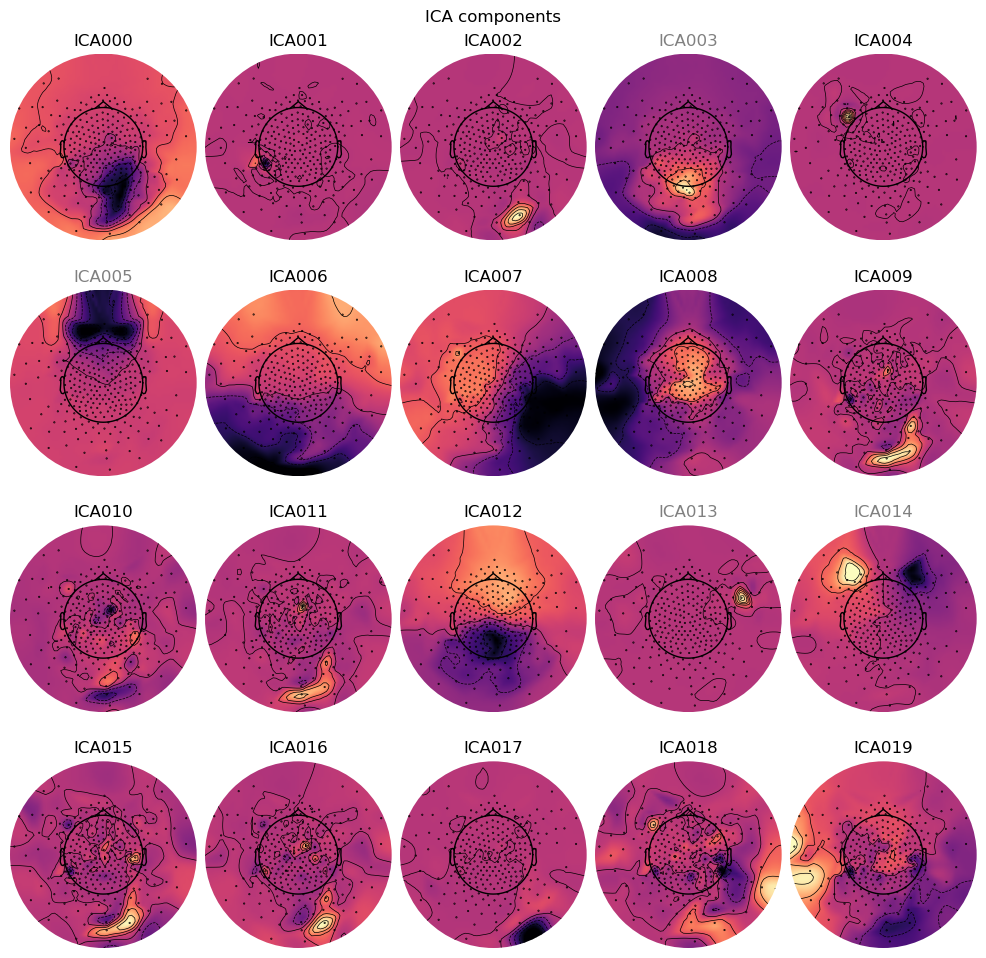

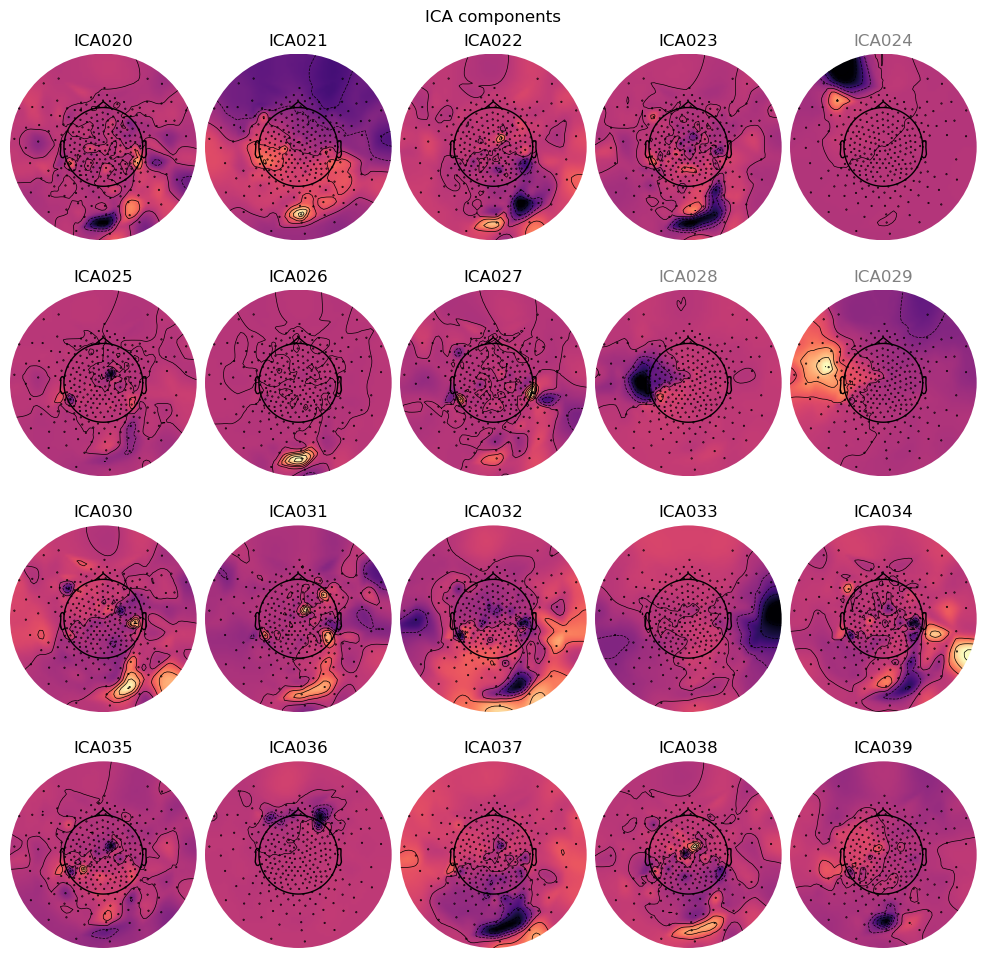

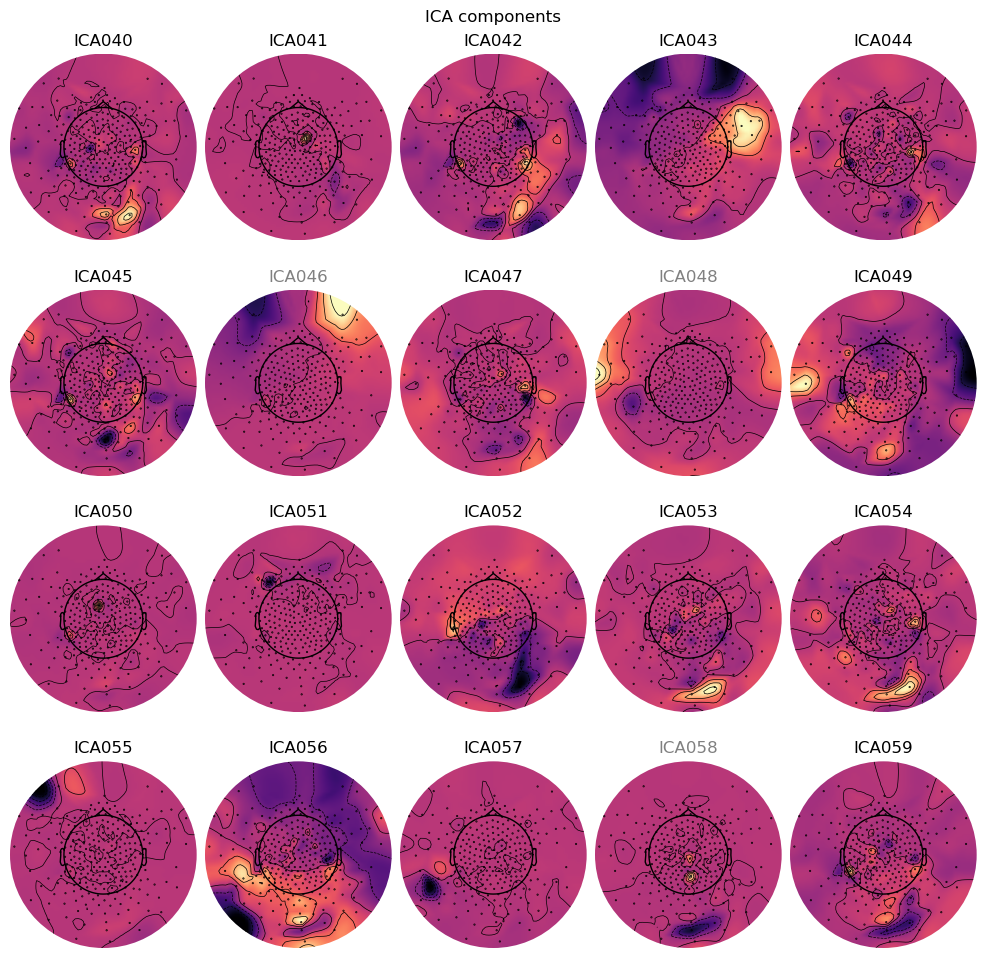

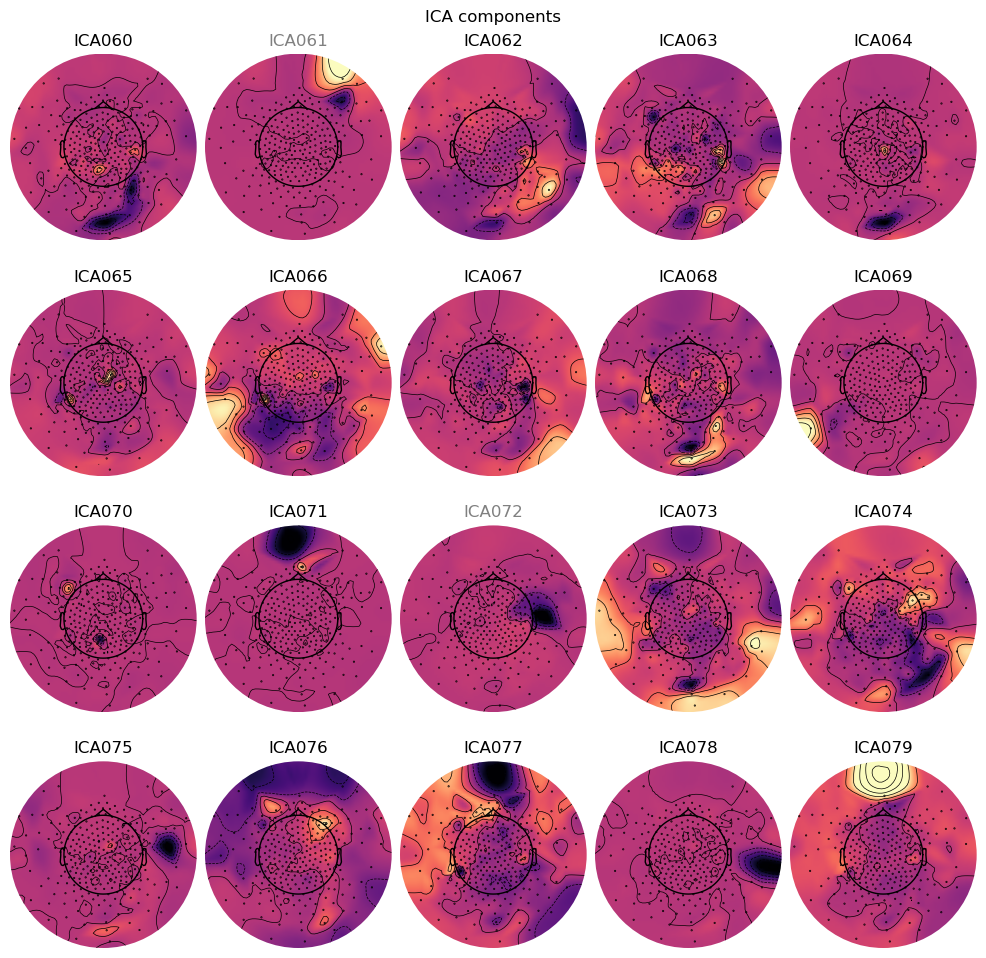

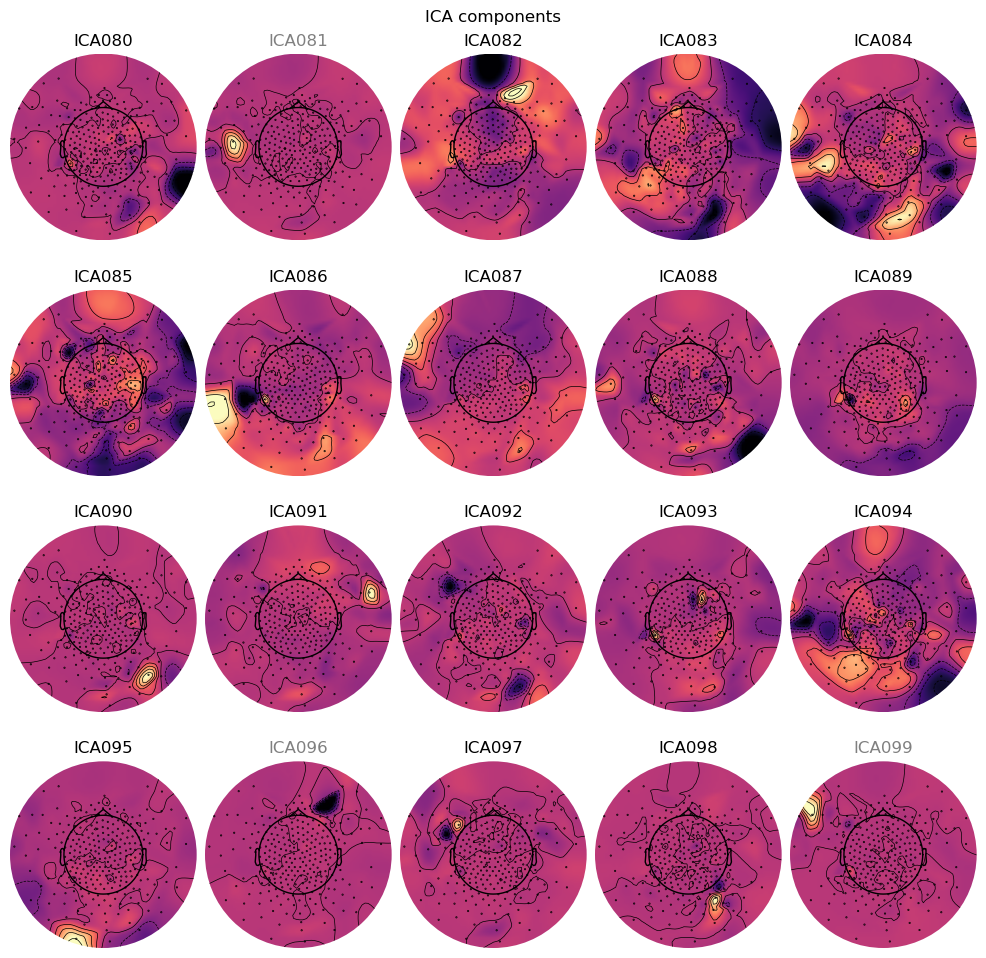

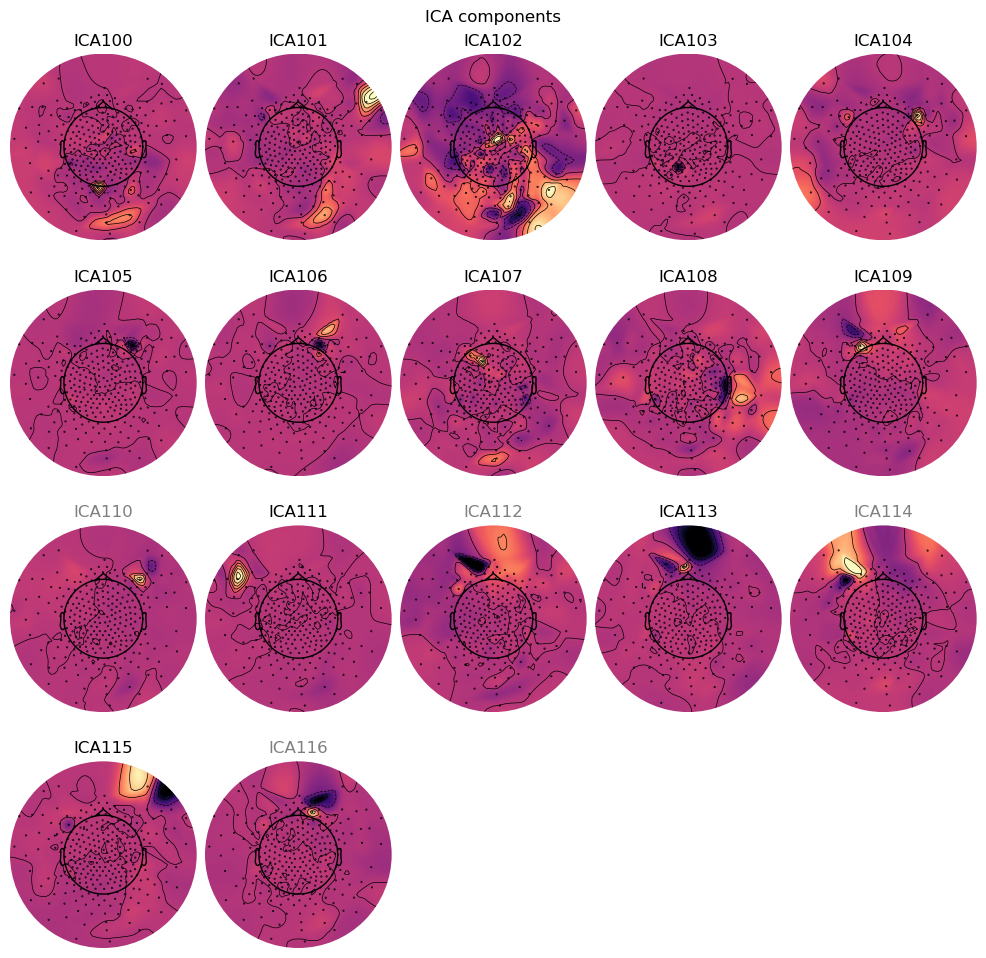

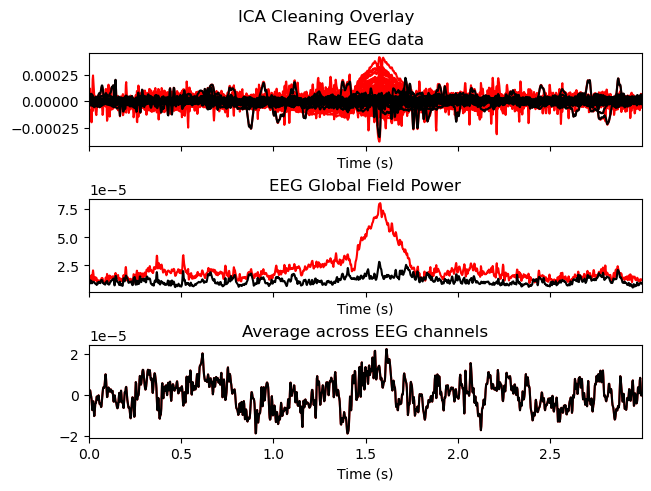

✅ ICA cleaning complete.


In [38]:
# Step 1: Automatic cleaning 

cleaned_data, ica_obj = run_automatic_ica_cleaning(
    raw_filtered,
    show_plots=True,
    cmap='magma'
)

📊 Displaying ICA components: [1, 2, 3]


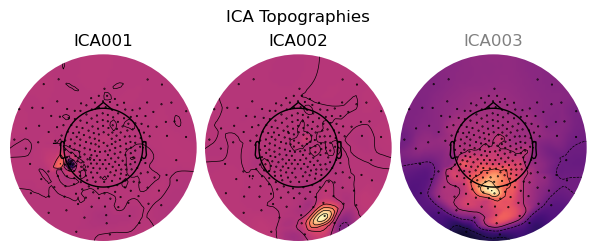

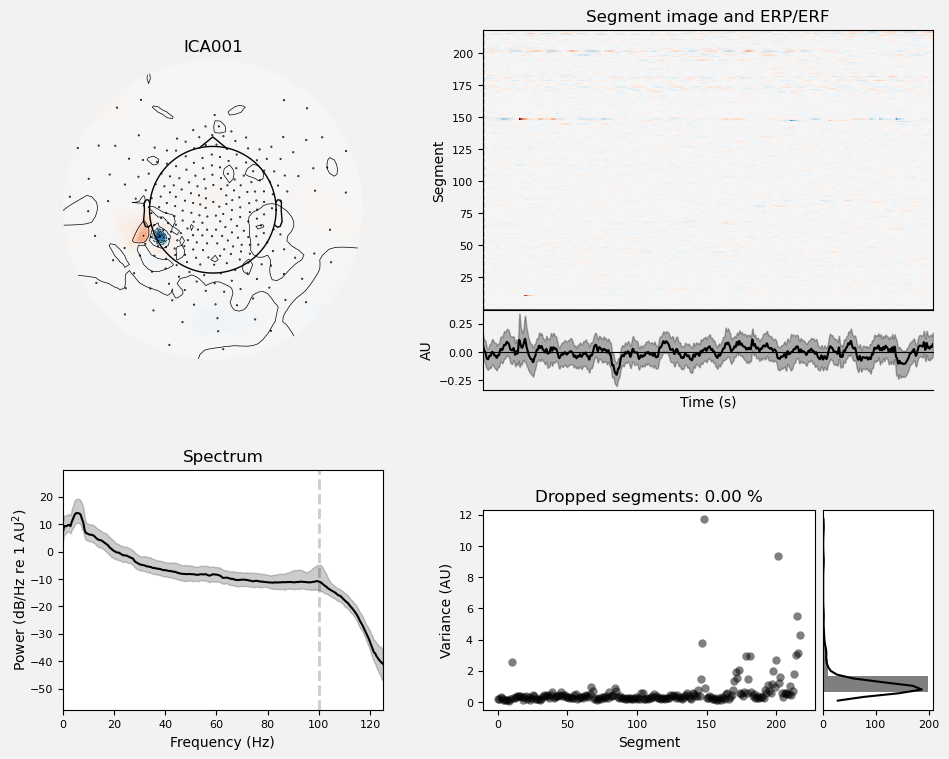

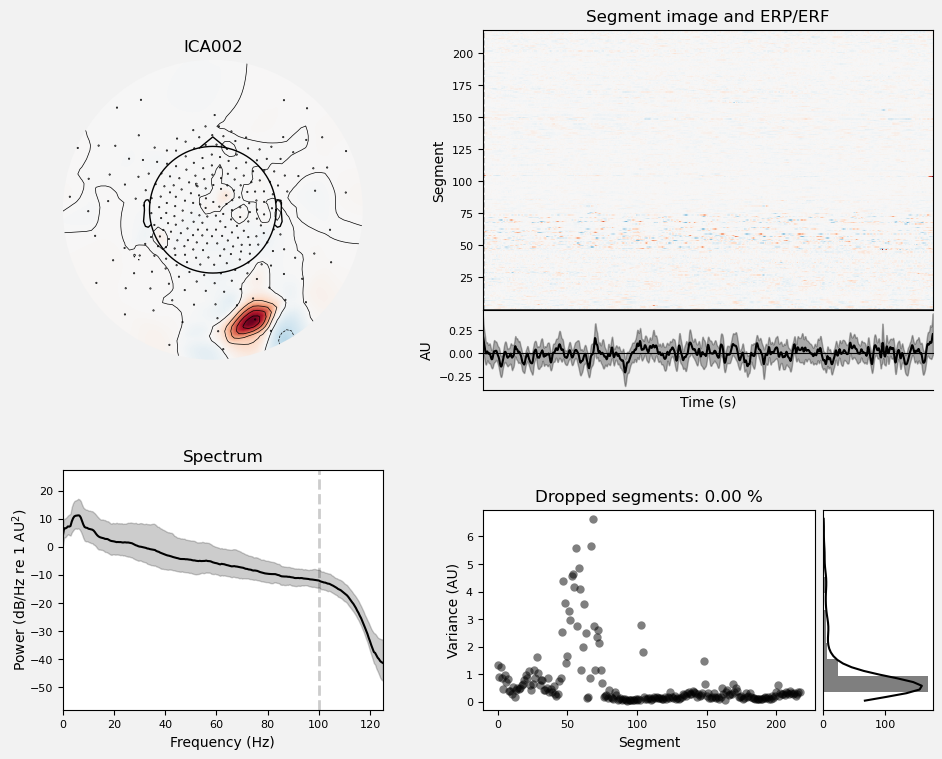

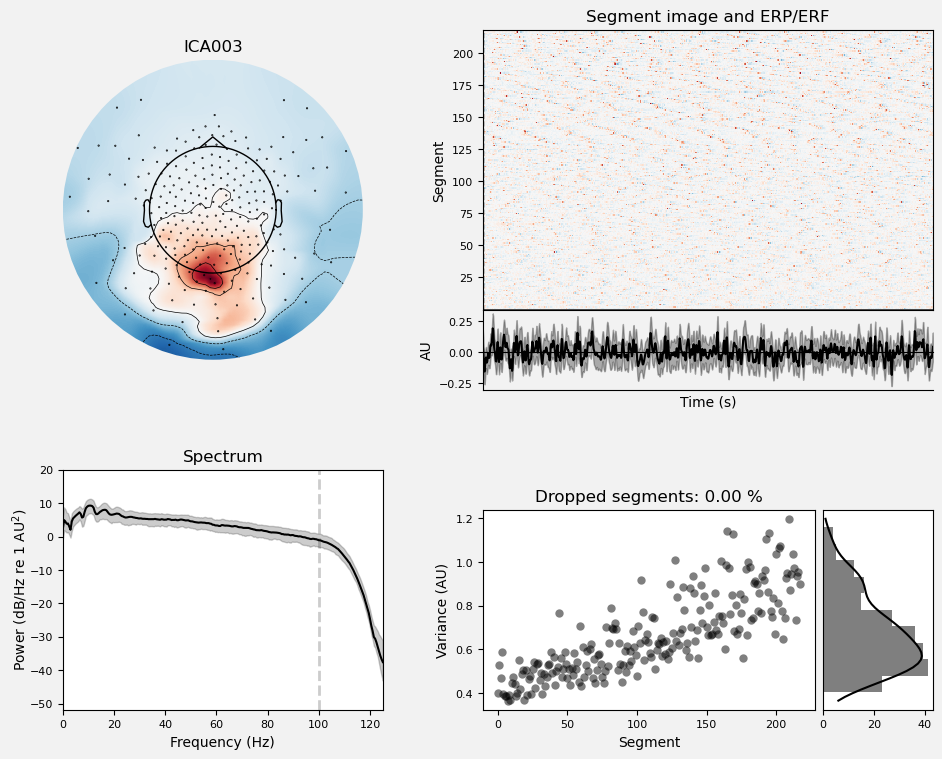

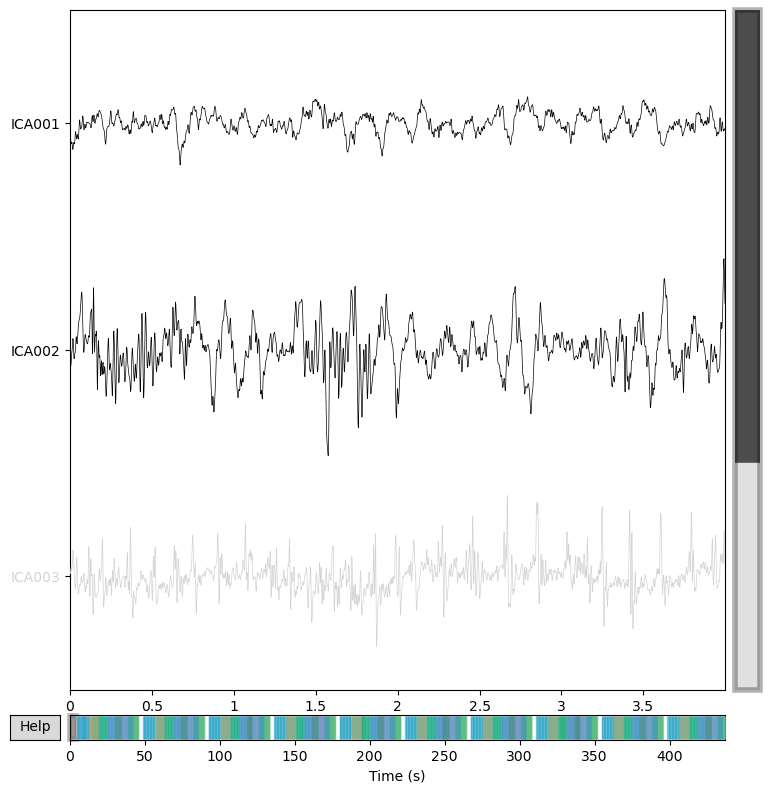

✅ Plots displayed. Close them to continue.


In [39]:
# Step 2: Manual inspection of specific components

list_of_components = list(range(1, 4))

check_components = list_of_components 
display_ica_components(ica_obj, check_components, time_window= 4, cmap='magma')

In [40]:
# Step 3: Apply additional manual rejections
bad_components = []

raw_ica, final_ica_obj = apply_manual_rejections(
    ica_obj, 
    cleaned_data, 
    bad_components
)

🔧 Applying manual rejections: []
✅ Final cleaned data has 291 EEG channels (all originals preserved)


In [41]:
# Mark Cz as bad if flat
if np.std(raw_ica.get_data(picks=['Cz'])[0]) < 1e-6:
    raw_ica.info['bads'].append('Cz')
    print("Marked Cz as bad due to flat signal.")


# Interpolate bad channels
raw_ica.interpolate_bads()

# Re-reference to average
# raw_ica.set_eeg_reference('average')

Marked Cz as bad due to flat signal.


<RawMff | signal1.bin, 291 x 218473 (436.9 s), ~485.4 MiB, data loaded>

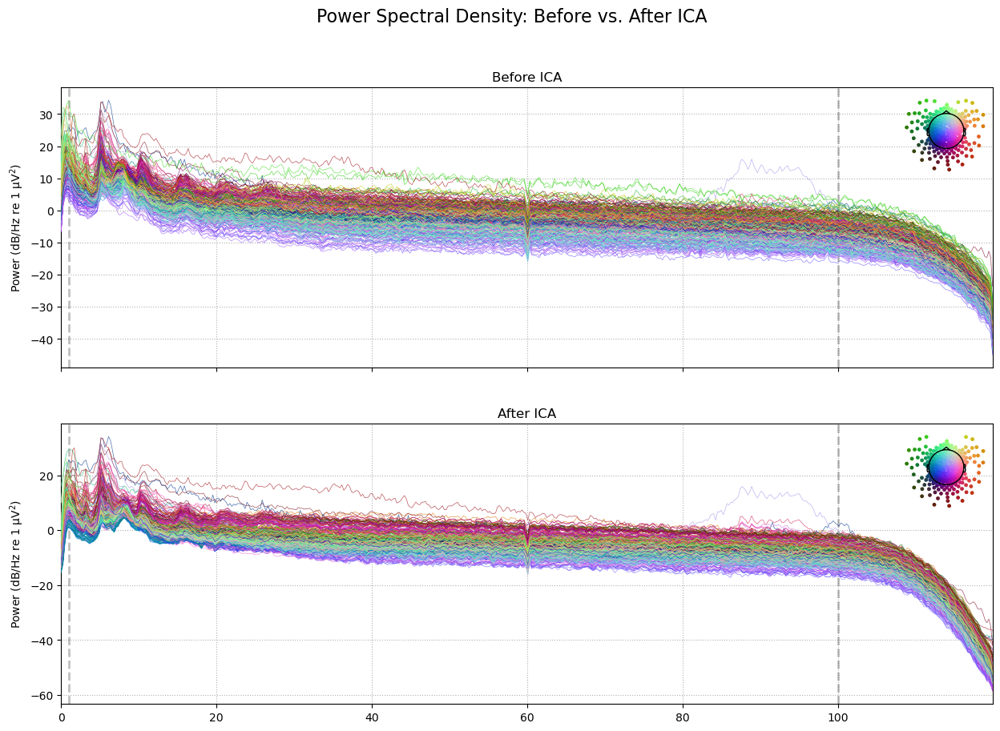

In [45]:
# Visually compare the data before and after ICA
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Plot PSD of data before ICA
# Mark Cz as bad if flat
raw_filtered.info['bads'].append('Cz')
raw_filtered.compute_psd(fmax=120, picks='eeg',exclude='bads').plot(axes=ax1, show=False)
ax1.set_title('Before ICA')
ax1.set_xlabel('')

# Plot PSD of data after ICA
raw_ica.compute_psd(fmax=120, picks='eeg',exclude='bads').plot(axes=ax2, show=False)
ax2.set_title('After ICA')

plt.suptitle('Power Spectral Density: Before vs. After ICA', fontsize=16)
plt.show()



## 5. Save ICA cleaned

In [44]:
# --- SAVE DATA ---

# Save the cleaned data
# Define base filename components for consistency
sub_id = '06'
ses_id = 'DBSOFF'
task_id = 'bima'

# Save the ICA-cleaned data
ica_cleaned_filename = f'sub-{sub_id}_ses-{ses_id}_task-{task_id}_eeg_ica_cleaned_raw.fif'
full_ica_cleaned_filepath = os.path.join(output_path, ica_cleaned_filename)
raw_ica.save(full_ica_cleaned_filepath, overwrite=True)
print(f"\n💾 ICA-cleaned data saved to: {full_ica_cleaned_filepath}")



💾 ICA-cleaned data saved to: /home/jaizor/jaizor/xtra/derivatives/working/sub-06/bima_DBSOFF/sub-06_ses-DBSOFF_task-bima_eeg_ica_cleaned_raw.fif
